In [25]:
# ==========================
# CELL 1: Install Packages
# ==========================
!pip install -q segmentation-models-pytorch albumentations pandas
print("✅ Packages installed!")

✅ Packages installed!


In [26]:
# ==========================
# CELL 2: Imports & Config (OPTIMIZED)
# ==========================

import os
import random
import gc
import cv2
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from glob import glob

import albumentations as A
from albumentations.pytorch import ToTensorV2

import segmentation_models_pytorch as smp
from sklearn.model_selection import train_test_split
from tqdm import tqdm

import matplotlib.pyplot as plt
import pandas as pd


# --------------------------
# Reproducibility (IMPORTANT)
# --------------------------
def seed_everything(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(42)


# --------------------------
# Config
# --------------------------
class Config:
    # ------------------
    # Paths (Kaggle)
    # ------------------
    TRAIN_IMG  = '/kaggle/input/terra-seg-rugged-terrain-segmentation/offroad-seg-kaggle/train_images/'
    TRAIN_MASK = '/kaggle/input/terra-seg-rugged-terrain-segmentation/offroad-seg-kaggle/train_masks/'
    TEST_IMG   = '/kaggle/input/terra-seg-rugged-terrain-segmentation/offroad-seg-kaggle/test_images_padded/'

    # ------------------
    # Training Params
    # ------------------
    IMG_SIZE = 448          # ↑ better boundary learning
    BATCH_SIZE = 2          # safe for T4 with IMG_SIZE=448
    EPOCHS = 23             # cosine LR needs more time
    LEARNING_RATE = 3e-4    # optimal for AdamW + ImageNet encoders

    # ------------------
    # Model
    # ------------------
    ENCODER = "resnet50"    # ⭐ best tradeoff for terrain
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
    MODEL_PATH = "best_model.pth"

    # ------------------
    # Task Settings
    # ------------------
    NUM_CLASSES = 1         # binary segmentation
    VEG_THRESHOLD = 18      # vegetation threshold (0–39 GT)


config = Config()


# --------------------------
# Logging
# --------------------------
print("=" * 80)
print("TERRA-SEG: BINARY TERRAIN SEGMENTATION")
print("=" * 80)
print(f"Device           : {config.DEVICE}")
print(f"Encoder          : {config.ENCODER}")
print(f"Image size       : {config.IMG_SIZE}")
print(f"Batch size       : {config.BATCH_SIZE}")
print(f"Epochs           : {config.EPOCHS}")
print(f"Learning rate    : {config.LEARNING_RATE}")
print("Task             : Sky + Bare Ground (1) vs Vegetation (0)")
print("=" * 80)


TERRA-SEG: BINARY TERRAIN SEGMENTATION
Device           : cuda
Encoder          : resnet50
Image size       : 448
Batch size       : 2
Epochs           : 23
Learning rate    : 0.0003
Task             : Sky + Bare Ground (1) vs Vegetation (0)


In [27]:
# ===============================
# CELL 3: Dataset & Transforms (OPTIMIZED)
# ===============================

class GrayscaleTerrainDataset(Dataset):
    """
    Binary Terrain Segmentation Dataset

    Target definition:
    - Vegetation (grass / bushes) → 0
    - Sky + Bare Ground           → 1

    Original GT masks are grayscale (0–39).
    Converted to binary using veg_threshold.
    """

    def __init__(self, images, masks, transform=None, veg_threshold=18):
        self.images = images
        self.masks = masks
        self.transform = transform
        self.veg_threshold = veg_threshold

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        # ------------------
        # Load image (RGB)
        # ------------------
        img = cv2.imread(self.images[idx], cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # ------------------
        # Load GT mask (0–39)
        # ------------------
        mask = cv2.imread(self.masks[idx], cv2.IMREAD_GRAYSCALE)
        mask = mask.astype(np.uint8)

        # ------------------
        # Binary conversion
        # ------------------
        target = (mask > self.veg_threshold).astype(np.float32)

        # ------------------
        # Augment
        # ------------------
        if self.transform:
            augmented = self.transform(image=img, mask=target)
            img = augmented["image"]
            target = augmented["mask"].unsqueeze(0)

        return img, target


# -------------------------------
# Transforms
# -------------------------------

train_transform = A.Compose([
    A.Resize(
        config.IMG_SIZE,
        config.IMG_SIZE,
        interpolation=cv2.INTER_LINEAR
    ),

    # Geometry (realistic)
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=15, p=0.5),
    A.ShiftScaleRotate(
        shift_limit=0.08,
        scale_limit=0.15,
        rotate_limit=0,
        p=0.5
    ),

    # Vegetation-sensitive color space aug
    A.HueSaturationValue(
        hue_shift_limit=8,
        sat_shift_limit=20,
        val_shift_limit=10,
        p=0.6
    ),
    A.RandomBrightnessContrast(
        brightness_limit=0.2,
        contrast_limit=0.2,
        p=0.6
    ),

    # Light blur only (avoid destroying edges)
    A.OneOf(
        [
            A.GaussianBlur(blur_limit=3),
            A.MotionBlur(blur_limit=3)
        ],
        p=0.15
    ),

    # Regularization
    A.CoarseDropout(
        max_holes=6,
        max_height=24,
        max_width=24,
        fill_value=0,
        p=0.25
    ),

    A.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),

    ToTensorV2(),
])


val_transform = A.Compose([
    A.Resize(
        config.IMG_SIZE,
        config.IMG_SIZE,
        interpolation=cv2.INTER_LINEAR
    ),
    A.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),
    ToTensorV2(),
])


print("✅ CELL 3 READY: High-accuracy terrain dataset & transforms loaded")


✅ CELL 3 READY: High-accuracy terrain dataset & transforms loaded


/tmp/ipykernel_55/1106504178.py:99: UserWarning: Argument(s) 'max_holes, max_height, max_width, fill_value' are not valid for transform CoarseDropout
  A.CoarseDropout(


In [28]:
# ===============================
# LOSS FUNCTION (OPTIMIZED)
# ===============================

class BCEDiceLoss(nn.Module):
    """
    Binary Cross-Entropy + Dice Loss
    Best choice for foreground/background segmentation.
    """

    def __init__(self, dice_weight=0.6, pos_weight=None):
        super().__init__()

        if pos_weight is not None:
            self.bce = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
        else:
            self.bce = nn.BCEWithLogitsLoss()

        self.dice_weight = dice_weight

    def forward(self, logits, targets):
        # ------------------
        # BCE (logits-safe)
        # ------------------
        bce = self.bce(logits, targets)

        # ------------------
        # Dice
        # ------------------
        probs = torch.sigmoid(logits)

        probs_f = probs.view(-1)
        targets_f = targets.view(-1)

        intersection = (probs_f * targets_f).sum()
        dice_loss = 1 - (2. * intersection + 1.) / (
            probs_f.sum() + targets_f.sum() + 1.
        )

        # ------------------
        # Combined
        # ------------------
        return (1 - self.dice_weight) * bce + self.dice_weight * dice_loss


In [29]:
# ===============================
# CELL 4: Train Model (OPTIMIZED)
# ===============================

# ------------------
# IoU Metric
# ------------------
def iou_metric(logits, targets, threshold=0.5, eps=1e-6):
    probs = torch.sigmoid(logits)
    preds = (probs > threshold).float()

    preds = preds.view(-1)
    targets = targets.view(-1)

    intersection = (preds * targets).sum()
    union = preds.sum() + targets.sum() - intersection

    return (intersection + eps) / (union + eps)


# ------------------
# Load Data
# ------------------
train_imgs = sorted(glob(f"{config.TRAIN_IMG}*.png"))
train_masks = sorted(glob(f"{config.TRAIN_MASK}*.png"))

print(f"Found {len(train_imgs)} training images")

train_x, val_x, train_y, val_y = train_test_split(
    train_imgs,
    train_masks,
    test_size=0.15,
    random_state=42
)

train_ds = GrayscaleTerrainDataset(train_x, train_y, train_transform)
val_ds   = GrayscaleTerrainDataset(val_x, val_y, val_transform)

pin_memory = config.DEVICE == "cuda"

train_loader = DataLoader(
    train_ds,
    batch_size=config.BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=pin_memory,
    drop_last=True
)

val_loader = DataLoader(
    val_ds,
    batch_size=config.BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=pin_memory
)


# ------------------
# Model
# ------------------
model = smp.Unet(
    encoder_name=config.ENCODER,
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
    activation=None,
    decoder_attention_type="scse"  # ⭐ improves boundaries
).to(config.DEVICE)

print(f"✅ Model: UNet + {config.ENCODER}")
print("   Task: Sky + Bare Ground vs Vegetation\n")


# ------------------
# Loss, Optimizer, Scheduler
# ------------------
criterion = BCEDiceLoss(dice_weight=0.6)

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=config.LEARNING_RATE,
    weight_decay=1e-4
)

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=config.EPOCHS
)

scaler = torch.cuda.amp.GradScaler(enabled=(config.DEVICE == "cuda"))


# ------------------
# Training Loop
# ------------------
best_iou = 0.0

print(f"🎯 Starting Training ({config.EPOCHS} epochs)...\n")

for epoch in range(config.EPOCHS):

    # -------- TRAIN --------
    model.train()
    train_loss = 0.0

    pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{config.EPOCHS}")
    for images, masks in pbar:

        images = images.to(config.DEVICE, non_blocking=True)
        masks  = masks.to(config.DEVICE, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with torch.cuda.amp.autocast(enabled=(config.DEVICE == "cuda")):
            logits = model(images)
            loss = criterion(logits, masks)

        scaler.scale(loss).backward()

        # Gradient clipping (important)
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

        scaler.step(optimizer)
        scaler.update()

        train_loss += loss.item()
        pbar.set_postfix({"loss": f"{loss.item():.4f}"})

    train_loss /= len(train_loader)


    # -------- VALIDATION --------
    model.eval()
    val_loss = 0.0
    val_iou = 0.0

    with torch.no_grad():
        for images, masks in val_loader:
            images = images.to(config.DEVICE, non_blocking=True)
            masks  = masks.to(config.DEVICE, non_blocking=True)

            logits = model(images)
            loss = criterion(logits, masks)

            val_loss += loss.item()
            val_iou  += iou_metric(logits, masks).item()

    val_loss /= len(val_loader)
    val_iou  /= len(val_loader)

    scheduler.step()

    print(
        f"Epoch {epoch+1:02d} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val IoU: {val_iou:.4f}"
    )

    # -------- SAVE BEST --------
    if val_iou > best_iou:
        best_iou = val_iou
        torch.save(model.state_dict(), config.MODEL_PATH)
        print(f"  ✅ Saved new best model (IoU = {best_iou:.4f})")

    torch.cuda.empty_cache()
    gc.collect()


print(f"\n✅ Training complete! Best Validation IoU: {best_iou:.4f}\n")


Found 3174 training images


/tmp/ipykernel_55/1154852823.py:91: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(config.DEVICE == "cuda"))


✅ Model: UNet + resnet50
   Task: Sky + Bare Ground vs Vegetation

🎯 Starting Training (23 epochs)...



Epoch 1/23:   0%|          | 0/1348 [00:00<?, ?it/s]/tmp/ipykernel_55/1154852823.py:115: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(config.DEVICE == "cuda")):
Epoch 1/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.27it/s, loss=0.1872]


Epoch 01 | Train Loss: 0.2030 | Val Loss: 0.1739 | Val IoU: 0.8296
  ✅ Saved new best model (IoU = 0.8296)


Epoch 2/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.1524]


Epoch 02 | Train Loss: 0.1716 | Val Loss: 0.1561 | Val IoU: 0.8488
  ✅ Saved new best model (IoU = 0.8488)


Epoch 3/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.1501]


Epoch 03 | Train Loss: 0.1633 | Val Loss: 0.1487 | Val IoU: 0.8553
  ✅ Saved new best model (IoU = 0.8553)


Epoch 4/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.1744]


Epoch 04 | Train Loss: 0.1578 | Val Loss: 0.1473 | Val IoU: 0.8550


Epoch 5/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.0912]


Epoch 05 | Train Loss: 0.1534 | Val Loss: 0.1429 | Val IoU: 0.8594
  ✅ Saved new best model (IoU = 0.8594)


Epoch 6/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.1616]


Epoch 06 | Train Loss: 0.1518 | Val Loss: 0.1386 | Val IoU: 0.8636
  ✅ Saved new best model (IoU = 0.8636)


Epoch 7/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.0986]


Epoch 07 | Train Loss: 0.1494 | Val Loss: 0.1363 | Val IoU: 0.8663
  ✅ Saved new best model (IoU = 0.8663)


Epoch 8/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.2056]


Epoch 08 | Train Loss: 0.1460 | Val Loss: 0.1378 | Val IoU: 0.8637


Epoch 9/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.1630]


Epoch 09 | Train Loss: 0.1450 | Val Loss: 0.1389 | Val IoU: 0.8649


Epoch 10/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.1798]


Epoch 10 | Train Loss: 0.1436 | Val Loss: 0.1329 | Val IoU: 0.8695
  ✅ Saved new best model (IoU = 0.8695)


Epoch 11/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.1330]


Epoch 11 | Train Loss: 0.1411 | Val Loss: 0.1322 | Val IoU: 0.8701
  ✅ Saved new best model (IoU = 0.8701)


Epoch 12/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.1210]


Epoch 12 | Train Loss: 0.1406 | Val Loss: 0.1317 | Val IoU: 0.8704
  ✅ Saved new best model (IoU = 0.8704)


Epoch 13/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.0940]


Epoch 13 | Train Loss: 0.1394 | Val Loss: 0.1323 | Val IoU: 0.8699


Epoch 14/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.27it/s, loss=0.0902]


Epoch 14 | Train Loss: 0.1383 | Val Loss: 0.1300 | Val IoU: 0.8723
  ✅ Saved new best model (IoU = 0.8723)


Epoch 15/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.1018]


Epoch 15 | Train Loss: 0.1376 | Val Loss: 0.1326 | Val IoU: 0.8700


Epoch 16/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.0676]


Epoch 16 | Train Loss: 0.1362 | Val Loss: 0.1292 | Val IoU: 0.8729
  ✅ Saved new best model (IoU = 0.8729)


Epoch 17/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.1181]


Epoch 17 | Train Loss: 0.1361 | Val Loss: 0.1295 | Val IoU: 0.8727


Epoch 18/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.1170]


Epoch 18 | Train Loss: 0.1347 | Val Loss: 0.1282 | Val IoU: 0.8737
  ✅ Saved new best model (IoU = 0.8737)


Epoch 19/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.1525]


Epoch 19 | Train Loss: 0.1346 | Val Loss: 0.1282 | Val IoU: 0.8737
  ✅ Saved new best model (IoU = 0.8737)


Epoch 20/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.1226]


Epoch 20 | Train Loss: 0.1341 | Val Loss: 0.1278 | Val IoU: 0.8739
  ✅ Saved new best model (IoU = 0.8739)


Epoch 21/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.1947]


Epoch 21 | Train Loss: 0.1340 | Val Loss: 0.1278 | Val IoU: 0.8742
  ✅ Saved new best model (IoU = 0.8742)


Epoch 22/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.2254]


Epoch 22 | Train Loss: 0.1342 | Val Loss: 0.1275 | Val IoU: 0.8745
  ✅ Saved new best model (IoU = 0.8745)


Epoch 23/23: 100%|██████████| 1348/1348 [03:05<00:00,  7.28it/s, loss=0.2315]


Epoch 23 | Train Loss: 0.1342 | Val Loss: 0.1273 | Val IoU: 0.8746
  ✅ Saved new best model (IoU = 0.8746)

✅ Training complete! Best Validation IoU: 0.8746



🔍 Running diagnostics: Sky + Bare Ground vs Vegetation

BINARY SEGMENTATION METRICS
Foreground coverage (Prediction): 60.90%
Foreground coverage (GT):         61.17%
Precision:                        0.9346
Recall:                           0.9306
F1 Score:                         0.9326
Validation IoU:                   0.8737

📊 Threshold sensitivity:
  t=0.3 → IoU=0.8737, F1=0.9326
  t=0.4 → IoU=0.8737, F1=0.9326
  t=0.5 → IoU=0.8737, F1=0.9326
  t=0.6 → IoU=0.8737, F1=0.9326
  t=0.7 → IoU=0.8737, F1=0.9326


/tmp/ipykernel_55/3382811588.py:153: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_55/3382811588.py:153: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_55/3382811588.py:153: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128309 (\N{LARGE BLUE CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


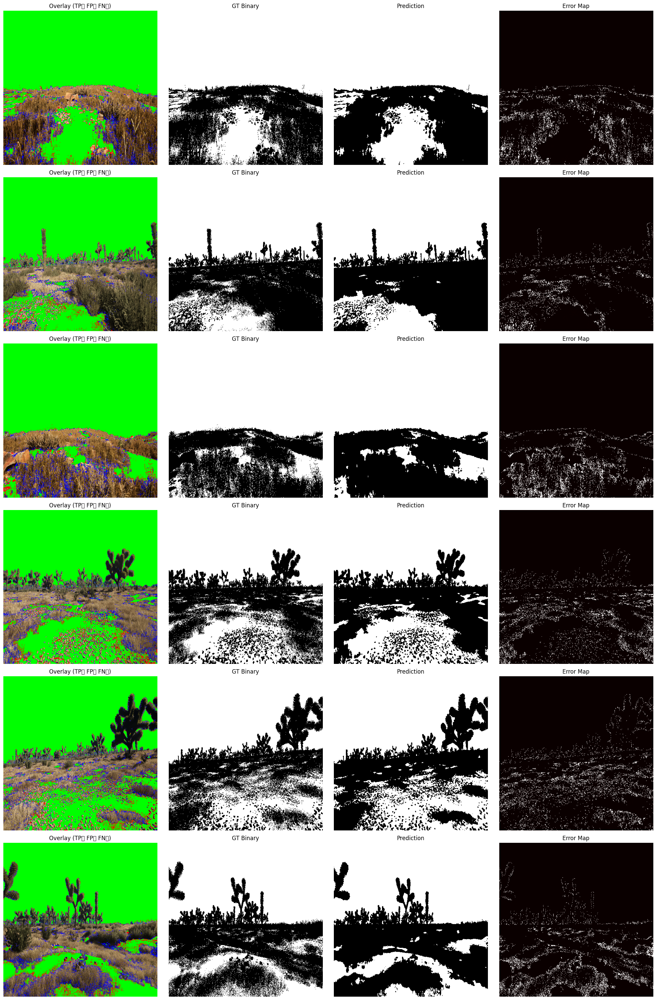

✅ Diagnostics complete — metrics and visuals validated.


In [30]:
# ===============================
# CELL 5: Diagnostics & Evaluation (OPTIMIZED)
# ===============================

# ------------------
# Load Best Model
# ------------------
model.load_state_dict(
    torch.load(config.MODEL_PATH, map_location=config.DEVICE)
)
model.eval()

print("🔍 Running diagnostics: Sky + Bare Ground vs Vegetation\n")


# ------------------
# Settings
# ------------------
THRESHOLD = 0.5
VEG_THRESHOLD = config.VEG_THRESHOLD
MAX_SAMPLES = 40


# ------------------
# Metric Helpers
# ------------------
def compute_metrics(preds, gts, eps=1e-6):
    tp = np.sum((preds == 1) & (gts == 1))
    fp = np.sum((preds == 1) & (gts == 0))
    fn = np.sum((preds == 0) & (gts == 1))

    precision = tp / (tp + fp + eps)
    recall    = tp / (tp + fn + eps)
    f1        = 2 * precision * recall / (precision + recall + eps)
    iou       = tp / (tp + fp + fn + eps)

    return precision, recall, f1, iou


# ------------------
# Run Inference
# ------------------
all_preds, all_gts = [], []

with torch.no_grad():
    for idx in range(min(MAX_SAMPLES, len(val_x))):

        img = cv2.imread(val_x[idx], cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        mask_gt = cv2.imread(val_y[idx], cv2.IMREAD_GRAYSCALE)
        gt_bin = (mask_gt > VEG_THRESHOLD).astype(np.uint8)

        aug = val_transform(image=img, mask=gt_bin)
        img_tensor = aug["image"].unsqueeze(0).to(config.DEVICE)
        gt_resized = aug["mask"].cpu().numpy().astype(np.uint8)

        logits = model(img_tensor)
        probs = torch.sigmoid(logits).squeeze().cpu().numpy()
        pred_bin = (probs > THRESHOLD).astype(np.uint8)

        all_preds.append(pred_bin.flatten())
        all_gts.append(gt_resized.flatten())


all_preds = np.concatenate(all_preds)
all_gts   = np.concatenate(all_gts)


# ------------------
# Metrics
# ------------------
precision, recall, f1, iou = compute_metrics(all_preds, all_gts)

print("=" * 80)
print("BINARY SEGMENTATION METRICS")
print("=" * 80)
print(f"Foreground coverage (Prediction): {all_preds.mean() * 100:.2f}%")
print(f"Foreground coverage (GT):         {all_gts.mean() * 100:.2f}%")
print(f"Precision:                        {precision:.4f}")
print(f"Recall:                           {recall:.4f}")
print(f"F1 Score:                         {f1:.4f}")
print(f"Validation IoU:                   {iou:.4f}")
print("=" * 80)


# ------------------
# Threshold Sensitivity (Optional)
# ------------------
print("\n📊 Threshold sensitivity:")
for t in [0.3, 0.4, 0.5, 0.6, 0.7]:
    p, r, f, i = compute_metrics(
        (all_preds > t).astype(np.uint8),
        all_gts
    )
    print(f"  t={t:.1f} → IoU={i:.4f}, F1={f:.4f}")


# ===============================
# VISUAL DIAGNOSTICS
# ===============================
NUM_SAMPLES = 6
indices = np.random.choice(len(val_x), NUM_SAMPLES, replace=False)

fig, axes = plt.subplots(NUM_SAMPLES, 4, figsize=(20, 5 * NUM_SAMPLES))

for i, idx in enumerate(indices):

    img = cv2.imread(val_x[idx], cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    mask_gt = cv2.imread(val_y[idx], cv2.IMREAD_GRAYSCALE)
    gt_bin = (mask_gt > VEG_THRESHOLD).astype(np.uint8)

    aug = val_transform(image=img, mask=gt_bin)
    img_tensor = aug["image"].unsqueeze(0).to(config.DEVICE)
    gt_resized = aug["mask"].cpu().numpy().astype(np.uint8)

    with torch.no_grad():
        probs = torch.sigmoid(model(img_tensor)).squeeze().cpu().numpy()

    pred_bin = (probs > THRESHOLD).astype(np.uint8)

    # ------------------
    # Overlay (TP=Green, FP=Red, FN=Blue)
    # ------------------
    overlay = cv2.resize(img, (config.IMG_SIZE, config.IMG_SIZE))

    tp = (pred_bin == 1) & (gt_resized == 1)
    fp = (pred_bin == 1) & (gt_resized == 0)
    fn = (pred_bin == 0) & (gt_resized == 1)

    overlay[tp] = [0, 255, 0]
    overlay[fp] = [255, 0, 0]
    overlay[fn] = [0, 0, 255]

    axes[i, 0].imshow(overlay)
    axes[i, 0].set_title("Overlay (TP🟢 FP🔴 FN🔵)")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(gt_resized, cmap="gray")
    axes[i, 1].set_title("GT Binary")
    axes[i, 1].axis("off")

    axes[i, 2].imshow(pred_bin, cmap="gray")
    axes[i, 2].set_title("Prediction")
    axes[i, 2].axis("off")

    axes[i, 3].imshow(np.abs(pred_bin - gt_resized), cmap="hot")
    axes[i, 3].set_title("Error Map")
    axes[i, 3].axis("off")

plt.tight_layout()
plt.show()

print("✅ Diagnostics complete — metrics and visuals validated.")


In [31]:
# ===============================================================================================
# SAVE GRAYSCALE PREDICTIONS (REQUIRED BY ORGANIZERS' CODE)
# ===============================================================================================

import os
import cv2
import numpy as np
from glob import glob
from tqdm import tqdm

OUT_DIR = "test_masks_padded"
os.makedirs(OUT_DIR, exist_ok=True)

test_imgs = sorted(glob(f"{config.TEST_IMG}*.png"))
print("Found test images:", len(test_imgs))

model.eval()

with torch.no_grad():
    for img_path in tqdm(test_imgs):
        name = os.path.basename(img_path)

        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        aug = val_transform(image=img_rgb)
        img_tensor = aug["image"].unsqueeze(0).to(config.DEVICE)

        pred = model(img_tensor)
        pred_sig = torch.sigmoid(pred * 1.5).squeeze().cpu().numpy()


        # Convert to grayscale 0–255
        # Map probabilities to label IDs expected by organizers
        # pred_sig close to 0 → terrain, close to 1 → sky (based on your training)
        
        terrain = pred_sig < 0.45   # you can tune 0.55–0.65
        gray = np.zeros_like(pred_sig, dtype=np.uint8)
        
        # Assign label IDs
        gray[terrain] = 27        # or 39, depending on class meaning


        # Resize back to original
        gray = cv2.resize(gray, (img.shape[1], img.shape[0]), interpolation=cv2.INTER_LINEAR)

        cv2.imwrite(os.path.join(OUT_DIR, name), gray)

print("✅ Grayscale masks saved to:", OUT_DIR)


Found test images: 1002


100%|██████████| 1002/1002 [00:44<00:00, 22.73it/s]

✅ Grayscale masks saved to: test_masks_padded


In [32]:
import os, glob
import cv2
import numpy as np

IN_DIR  = "test_masks_padded"
OUT_DIR = "binary_masks_27_39"

os.makedirs(OUT_DIR, exist_ok=True)

paths = sorted(glob.glob(os.path.join(IN_DIR, "*.png")))
print("Found masks:", len(paths))

kernel = np.ones((5,5), np.uint8)
min_area = 400

for p in paths:
    m = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
    if m is None:
        continue

    # ✅ FG = vegetation (everything NOT terrain)
    binary = (m == 0).astype(np.uint8)

    # cleanup
    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary)
    clean = np.zeros_like(binary)

    for i in range(1, num_labels):
        if stats[i, cv2.CC_STAT_AREA] >= min_area:
            clean[labels == i] = 1

    cv2.imwrite(
        os.path.join(OUT_DIR, os.path.basename(p)),
        clean * 255
    )

print("✅ Binary masks (vegetation FG) saved")


Found masks: 1002
✅ Binary masks (vegetation FG) saved


In [33]:
# remove noise
kernel = np.ones((5,5), np.uint8)
binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

# remove small blobs
num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(binary)
min_area = 400

clean = np.zeros_like(binary)
for i in range(1, num_labels):
    if stats[i, cv2.CC_STAT_AREA] > min_area:
        clean[labels == i] = 1

binary = clean


In [34]:
import os, glob
import cv2
import numpy as np
import pandas as pd

MASK_DIR = "binary_masks_27_39"   # ✅ NOT previews_27_39
OUT_CSV  = "submission.csv"       # or solution.csv

H, W = 540, 960

def rle_encode(mask01):
    pixels = mask01.flatten(order="F")
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return " ".join(map(str, runs))

rows = []
paths = sorted(glob.glob(os.path.join(MASK_DIR, "*.png")))
print("Found binary masks:", len(paths))

for p in paths:
    m = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
    if m is None:
        print("Skip unreadable:", p)
        continue
    if m.shape != (H, W):
        raise ValueError(f"{p} has shape {m.shape}, expected {(H,W)}")

    mask01 = (m > 0).astype(np.uint8)  # 0/255 -> 0/1
    rle = rle_encode(mask01)

    image_id = os.path.splitext(os.path.basename(p))[0]
    rows.append({"image_id": image_id, "encoded_pixels": rle})

df = pd.DataFrame(rows)
df.to_csv(OUT_CSV, index=False)
print("Saved:", OUT_CSV)

Found binary masks: 1002
Saved: submission.csv


Found images: 1002
Found masks : 1002


/tmp/ipykernel_55/684604635.py:62: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


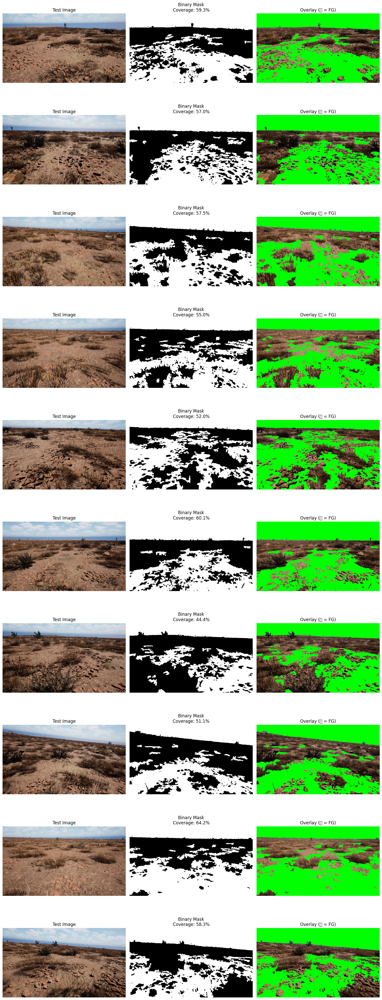

✅ Final visual sanity check complete


In [ ]:
# ===============================================================================================
# FINAL VISUAL CHECK: BINARY MASK + OVERLAY (CORRECT & SAFE)
# ===============================================================================================

import random
import matplotlib.pyplot as plt
import cv2
import os
import glob
import numpy as np

# Paths
IMG_DIR  = "/kaggle/input/terra-seg-rugged-terrain-segmentation/offroad-seg-kaggle/test_images_padded"
MASK_DIR = "binary_masks_27_39"   # final binary masks (0/255)

NUM_SAMPLES = 10   # keep small to avoid notebook freeze

# Collect paths
img_paths  = sorted(glob.glob(os.path.join(IMG_DIR, "*.png")))
mask_paths = sorted(glob.glob(os.path.join(MASK_DIR, "*.png")))

print(f"Found images: {len(img_paths)}")
print(f"Found masks : {len(mask_paths)}")

# Safety check
assert len(img_paths) == len(mask_paths), "❌ Image–mask count mismatch!"

# Random sampling
sample_ids = random.sample(range(len(img_paths)), NUM_SAMPLES)

# Plot
fig, axes = plt.subplots(NUM_SAMPLES, 3, figsize=(15, 4 * NUM_SAMPLES))

for i, idx in enumerate(sample_ids):
    # Load image
    img = cv2.imread(img_paths[idx])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Load binary mask
    mask = cv2.imread(mask_paths[idx], cv2.IMREAD_GRAYSCALE)
    mask01 = (mask > 0).astype(np.uint8)

    # Overlay
    overlay = img.copy()
    overlay[mask01 == 1] = [0, 255, 0]  # 🟢 foreground (terrain + grass + bush)

    # Display
    axes[i, 0].imshow(img)
    axes[i, 0].set_title("Test Image")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(mask01, cmap="gray")
    axes[i, 1].set_title(
        f"Binary Mask\nCoverage: {mask01.mean()*100:.1f}%"
    )
    axes[i, 1].axis("off")

    axes[i, 2].imshow(overlay)
    axes[i, 2].set_title("Overlay (🟢 = FG)")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()

print("✅ Final visual sanity check complete")


In [ ]:
from IPython.display import FileLink, display

display(FileLink("submission.csv"))


/kaggle/working/submission.csv

In [ ]:
import os

print("Exists:", os.path.exists("submission.csv"))
print("Size (MB):", os.path.getsize("submission.csv") / (1024*1024))


Exists: True
Size (MB): 51.968825340270996


In [ ]:
# ===============================================================================================
# SAVE LABEL-MAPPED GRAYSCALE PREDICTIONS FOR TRAIN IMAGES (DEBUG / VISUAL)
# ===============================================================================================

import os
import cv2
import numpy as np
from glob import glob
from tqdm import tqdm

OUT_DIR = "train_pred_labelmapped"
os.makedirs(OUT_DIR, exist_ok=True)

train_imgs = sorted(glob(f"{config.TRAIN_IMG}*.png"))
print("Found train images:", len(train_imgs))

model.eval()

with torch.no_grad():
    for img_path in tqdm(train_imgs):
        name = os.path.basename(img_path)

        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        aug = val_transform(image=img_rgb)
        img_tensor = aug["image"].unsqueeze(0).to(config.DEVICE)

        pred = model(img_tensor)
        pred_sig = torch.sigmoid(pred * 1.5).squeeze().cpu().numpy()


        # ---------------------------------------------------------
        # SAME LOGIC AS TEST GRAYSCALE SAVE (LABEL MAPPING)
        # pred_sig close to 0 → terrain
        # pred_sig close to 1 → sky
        # ---------------------------------------------------------
        terrain = pred_sig < 0.45   # same threshold as test
        gray = np.zeros_like(pred_sig, dtype=np.uint8)
        gray[terrain] = 27          # same FG label as test
        # ---------------------------------------------------------

        # Resize back to original image size
        gray = cv2.resize(
            gray,
            (img.shape[1], img.shape[0]),
            interpolation=cv2.INTER_LINEAR
        )

        cv2.imwrite(os.path.join(OUT_DIR, name), gray)

print("✅ Train label-mapped grayscale masks saved to:", OUT_DIR)


Found train images: 3174


100%|██████████| 3174/3174 [02:15<00:00, 23.44it/s]

✅ Train label-mapped grayscale masks saved to: train_pred_labelmapped


In [ ]:
# ===============================================================================================
# TRAIN: GRAYSCALE (27/39) → BINARY MASKS (0/255)
# ===============================================================================================

import os, glob
import cv2
import numpy as np

IN_DIR  = "train_pred_labelmapped"      # label-mapped grayscale from model
OUT_DIR = "train_binary_masks_27_39"    # binary output (0/255)

os.makedirs(OUT_DIR, exist_ok=True)

paths = sorted(glob.glob(os.path.join(IN_DIR, "*.png")))
print("Found train grayscale masks:", len(paths))

FG = {27, 39}

for p in paths:
    m = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
    if m is None:
        print("Skip unreadable:", p)
        continue

    # 27 or 39 → foreground
    b01 = np.isin(m, list(FG)).astype(np.uint8)

    out_path = os.path.join(OUT_DIR, os.path.basename(p))
    cv2.imwrite(out_path, b01 * 255)

print("✅ Train binary masks saved to:", OUT_DIR)

# Sanity check
if paths:
    sample = cv2.imread(
        os.path.join(OUT_DIR, os.path.basename(paths[0])),
        cv2.IMREAD_GRAYSCALE
    )
    print("Sample unique values:", np.unique(sample))


Found train grayscale masks: 3174
✅ Train binary masks saved to: train_binary_masks_27_39
Sample unique values: [  0 255]


In [ ]:
# ===============================================================================================
# TRAIN: BINARY MASKS → RLE CSV (DEBUG / VERIFICATION ONLY)
# ===============================================================================================

import os, glob
import cv2
import numpy as np
import pandas as pd

MASK_DIR = "train_binary_masks_27_39"
OUT_CSV  = "train_debug_rle.csv"

# Train images are NOT fixed size → infer per image
def rle_encode(mask01):
    pixels = mask01.flatten(order="F")
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return " ".join(map(str, runs))

rows = []
paths = sorted(glob.glob(os.path.join(MASK_DIR, "*.png")))
print("Found train binary masks:", len(paths))

for p in paths:
    m = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
    if m is None:
        print("Skip unreadable:", p)
        continue

    mask01 = (m > 0).astype(np.uint8)
    rle = rle_encode(mask01)

    image_id = os.path.splitext(os.path.basename(p))[0]
    rows.append({
        "image_id": image_id,
        "encoded_pixels": rle
    })

df = pd.DataFrame(rows)
df.to_csv(OUT_CSV, index=False)

print("✅ Train RLE CSV saved to:", OUT_CSV)
print("Rows:", len(df))


Found train binary masks: 3174
✅ Train RLE CSV saved to: train_debug_rle.csv
Rows: 3174


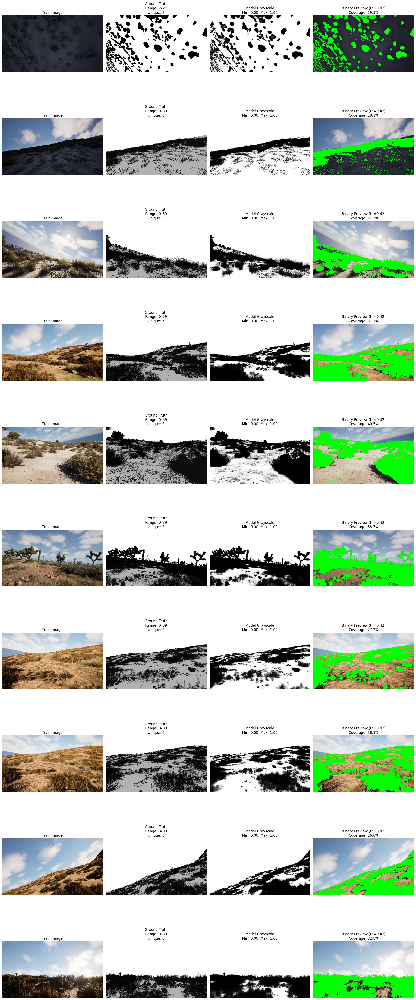

✅ Train-image visual sanity check complete


In [ ]:
# ===============================================================================================
# NEW CELL: VISUAL CHECK ON TRAIN IMAGES (GT vs Grayscale vs Binary Preview)
# ===============================================================================================

import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob

NUM_SAMPLES = 10
THRESHOLD_PREVIEW = 0.42   # just for visualization (does NOT affect submission)

# Paths (UNCHANGED GT, images from TRAIN_IMG)
train_img_paths  = sorted(glob(f"{config.TRAIN_IMG}*.png"))
train_mask_paths = sorted(glob(f"{config.TRAIN_MASK}*.png"))

assert len(train_img_paths) == len(train_mask_paths), "Train image / mask count mismatch!"

indices = random.sample(range(len(train_img_paths)), NUM_SAMPLES)

fig, axes = plt.subplots(NUM_SAMPLES, 4, figsize=(20, 5 * NUM_SAMPLES))

model.eval()

for i, idx in enumerate(indices):
    # Load image & GT mask
    img = cv2.imread(train_img_paths[idx])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gt  = cv2.imread(train_mask_paths[idx], cv2.IMREAD_GRAYSCALE)

    h, w = img.shape[:2]

    # Model prediction
    aug = val_transform(image=img)
    img_tensor = aug["image"].unsqueeze(0).to(config.DEVICE)

    with torch.no_grad():
        pred = model(img_tensor)
        pred_sig = torch.sigmoid(pred * 1.5).squeeze().cpu().numpy()

    pred_resized = cv2.resize(pred_sig, (w, h), interpolation=cv2.INTER_LINEAR)

    # Binary preview (NOT submission logic)
    binary_preview = (pred_resized < THRESHOLD_PREVIEW).astype(np.uint8)

    # Overlay
    overlay = img.copy()
    overlay[binary_preview == 1] = [0, 255, 0]

    # Plot
    axes[i, 0].imshow(img)
    axes[i, 0].set_title("Train Image")
    axes[i, 0].axis("off")

    axes[i, 1].imshow(gt, cmap="gray")
    axes[i, 1].set_title(
        f"Ground Truth\nRange: {gt.min()}–{gt.max()}\nUnique: {len(np.unique(gt))}"
    )
    axes[i, 1].axis("off")

    axes[i, 2].imshow(pred_resized, cmap="gray", vmin=0, vmax=1)
    axes[i, 2].set_title(
        f"Model Grayscale\nMin: {pred_resized.min():.2f}  Max: {pred_resized.max():.2f}"
    )
    axes[i, 2].axis("off")

    axes[i, 3].imshow(overlay)
    axes[i, 3].set_title(
        f"Binary Preview (th={THRESHOLD_PREVIEW})\nCoverage: {binary_preview.mean()*100:.1f}%"
    )
    axes[i, 3].axis("off")

plt.tight_layout()
plt.show()

print("✅ Train-image visual sanity check complete")


In [ ]:
import torch

torch.save(model.state_dict(), "current_model.pth")
print("✅ Current model saved as current_model.pth")


✅ Current model saved as current_model.pth


In [43]:
# ===============================
# SAVE MODEL FOR DOWNLOAD
# ===============================

SAVE_PATH = "/kaggle/working/terra_seg_best_model.pth"

torch.save(
    {
        "model_state_dict": model.state_dict(),
        "encoder": config.ENCODER,
        "img_size": config.IMG_SIZE,
        "veg_threshold": config.VEG_THRESHOLD,
        "threshold": 0.5,
    },
    SAVE_PATH
)

print(f"✅ Model saved to: {SAVE_PATH}")


✅ Model saved to: /kaggle/working/terra_seg_best_model.pth
